In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
import urllib.parse
import seaborn as sns
from tqdm import tqdm
import src.data.data_loader as data_loader

pd.options.mode.chained_assignment = None  # default='warn', Mutes warnings when copying a slice from a DataFrame.

In [3]:
all_paths, paths_finished, paths_unfinished = data_loader.load_paths()
articles = data_loader.load_articles()
categories = data_loader.load_categories()
links = data_loader.load_links()
distance_matrix = data_loader.load_distance_matrix()

---

In [3]:
all_paths.head()

,hashedIpAddress,timestamp,durationInSec,path,rating,status,target,backtracks,traversed,type
0,6a3701d319fc3754,1297740409,166,14th_century;15th_century;16th_century;Pacific...,NaN,finished,African slave trade,[],"[14th century, 15th century, 16th century, Pac...",NaN
1,3824310e536af032,1344753412,88,14th_century;Europe;Africa;Atlantic_slave_trad...,3.0,finished,African slave trade,[],"[14th century, Europe, Africa, Atlantic slave ...",NaN
2,415612e93584d30e,1349298640,138,14th_century;Niger;Nigeria;British_Empire;Slav...,NaN,finished,African slave trade,[],"[14th century, Niger, Nigeria, British Empire,...",NaN
3,64dd5cd342e3780c,1265613925,37,14th_century;Renaissance;Ancient_Greece;Greece,NaN,finished,Greece,[],"[14th century, Renaissance, Ancient Greece, Gr...",NaN
4,015245d773376aab,1366730828,175,14th_century;Italy;Roman_Catholic_Church;HIV;R...,3.0,finished,John F. Kennedy,[],"[14th century, Italy, Roman Catholic Church, H...",NaN


---

## Heatmap Fun

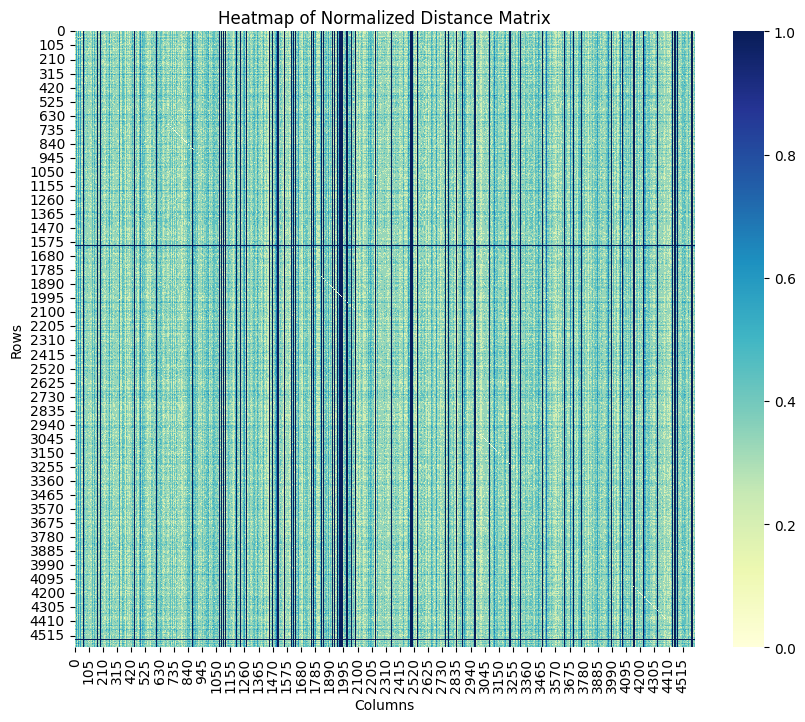

In [4]:
# Replace -1 values with np.nan to ignore them during normalization
distance_matrix_normalized = np.where(distance_matrix == -1, np.nan, distance_matrix)

# Perform normalization on the matrix, excluding NaN values
min_value = np.nanmin(distance_matrix_normalized)
max_value = np.nanmax(distance_matrix_normalized)
distance_matrix_normalized = (distance_matrix_normalized - min_value) / (max_value - min_value)

# Replace NaNs (original -1 values) with 1
distance_matrix_normalized = np.where(np.isnan(distance_matrix_normalized), 1, distance_matrix_normalized)

distance_matrix_normalized

plt.figure(figsize=(10, 8))
sns.heatmap(distance_matrix_normalized, cmap="YlGnBu", annot=False, cbar=True)
plt.title('Heatmap of Normalized Distance Matrix')
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.show()


In [5]:
article_similarities = pd.read_csv('data/article_similarities_matrix.csv')

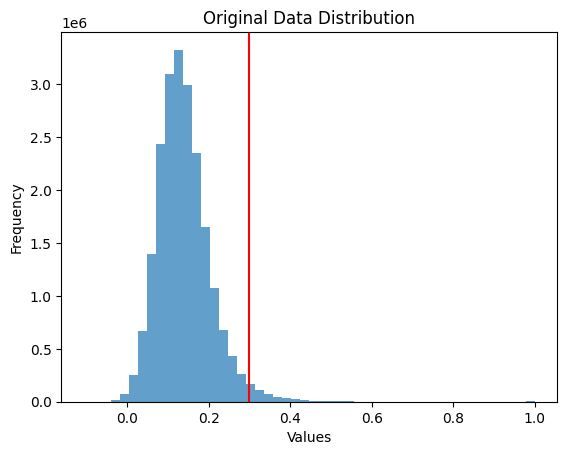

In [6]:
flattened_similarities = article_similarities.values.flatten()


plt.axvline(x=0.3, color = "red")
plt.hist(flattened_similarities, bins=50, alpha=0.7)
plt.title('Original Data Distribution')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.show()


In [7]:
total_elements = flattened_similarities.size
print(f"Total number of elements: {total_elements}")

Total number of elements: 21196816


In [8]:
count = (flattened_similarities > 0.3).sum()-articles.size #minus the number of article which are obviously related to themself
print(f"Number of values greater than 0.3: {count}")
print(f"Top percentage: {count*100/total_elements}")

Number of values greater than 0.3: 430018
Top percentage: 2.0286914789466493


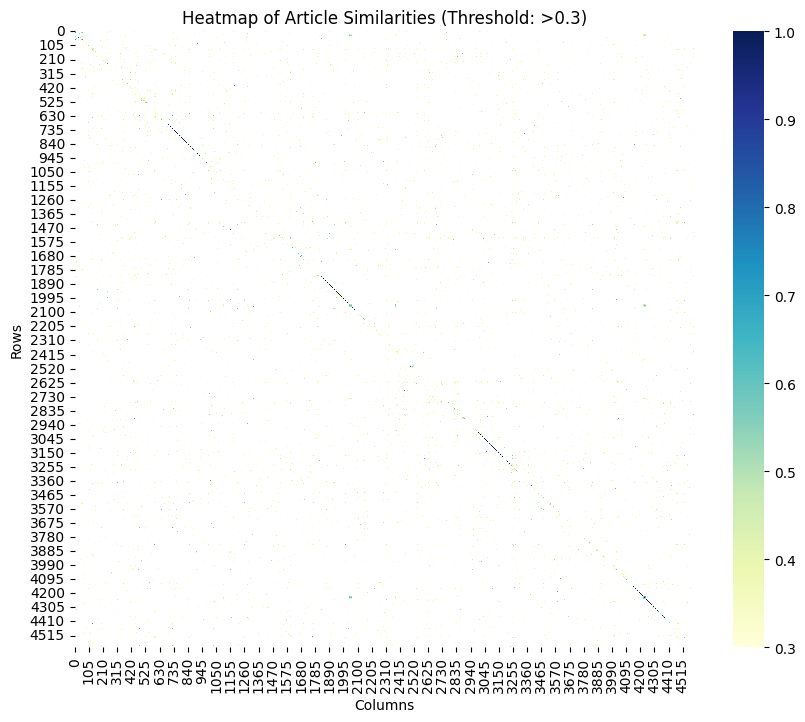

In [9]:
# Define a threshold value
threshold = 0.3

# Apply the threshold to the similarity matrix
thresholded_similarities = article_similarities.copy()
thresholded_similarities[thresholded_similarities < threshold] = np.nan  # Mask values below the threshold

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(thresholded_similarities, cmap="YlGnBu", annot=False, cbar=True, mask=np.isnan(thresholded_similarities))
plt.title(f'Heatmap of Article Similarities (Threshold: >{threshold})')
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.show()


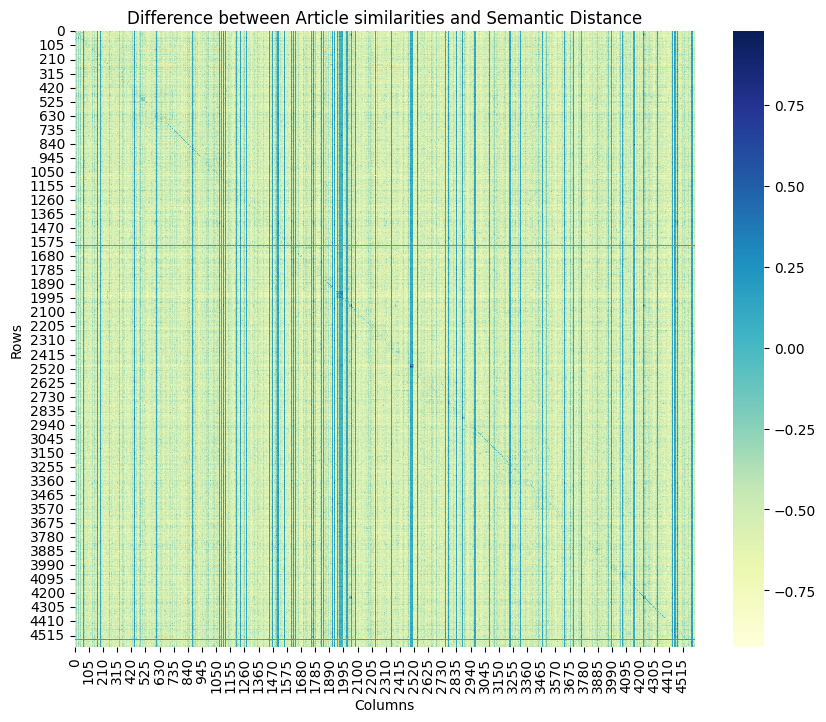

In [10]:
distance_diff = distance_matrix_normalized - np.abs(1-article_similarities) 

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(distance_diff, cmap="YlGnBu", annot=False, cbar=True)
plt.title(f'Difference between Article similarities and Semantic Distance')
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.show()

---

## Category Analysis

In [11]:
categories = data_loader.load_categories()


In [12]:
# Remove leading/trailing dots from the category column
categories['cleaned_category'] = categories['category'].str.strip('.')

# Replace dots with spaces for better readability
categories['cleaned_category'] = categories['cleaned_category'].str.replace('.', ' ', regex=False)

# Remove the word "subject"
categories['cleaned_category'] = categories['cleaned_category'].str.replace(r'\bsubject\b', '', regex=True).str.strip()

# Extract the main theme (first word) and create a new column
categories['main_theme'] = categories['cleaned_category'].apply(lambda x: x.split(' ')[0])

# Group by main theme and count occurrences
categories_grouped = categories.groupby('main_theme')['cleaned_category'].apply(list)
category_counts = categories['main_theme'].value_counts()

# Display results
print("Counts by main theme:")
print(category_counts)

print("\nCategories grouped by main theme:")
print(categories_grouped)


Counts by main theme:
main_theme
Science                    1122
Geography                  1084
People                      689
History                     545
Everyday_life               374
Design_and_Technology       254
Countries                   229
Citizenship                 224
Language_and_literature     196
Religion                    134
Music                        97
Business_Studies             88
IT                           85
Mathematics                  45
Art                          38
Name: count, dtype: int64

Categories grouped by main theme:
main_theme
Art                        [Art Art, Art Art, Art Art, Art Art, Art Art, ...
Business_Studies           [Business_Studies Currency, Business_Studies C...
Citizenship                [Citizenship Environment, Citizenship Politics...
Countries                  [Countries, Countries, Countries, Countries, C...
Design_and_Technology      [Design_and_Technology Railway_transport, Desi...
Everyday_life              [Ev

In [13]:
categories.head()

,article,category,cleaned_category,main_theme
0,Áedán mac Gabráin,subject.History.British_History.British_Histor...,History British_History British_History_1500_a...,History
1,Áedán mac Gabráin,subject.People.Historical_figures,People Historical_figures,People
2,Åland,subject.Countries,Countries,Countries
3,Åland,subject.Geography.European_Geography.European_...,Geography European_Geography European_Countries,Geography
4,Édouard Manet,subject.People.Artists,People Artists,People


In [14]:
categories.groupby('main_theme')['main_theme'].count()

main_theme
Art                          38
Business_Studies             88
Citizenship                 224
Countries                   229
Design_and_Technology       254
Everyday_life               374
Geography                  1084
History                     545
IT                           85
Language_and_literature     196
Mathematics                  45
Music                        97
People                      689
Religion                    134
Science                    1122
Name: main_theme, dtype: int64

In [15]:
main_cat_dict = dict(zip(categories['article'], categories['cleaned_category']))

In [16]:
main_cat_dict.get("Sunlight")

'Geography Climate_and_the_Weather'

In [17]:
all_backtracks = all_paths['backtracks'].dropna()

all_backtracks = all_backtracks.astype(str).str.replace(r"[\[\]]", "", regex=True).str.split(';')

# Flatten the cleaned list of lists
flattened_backtracks = [item.strip() for sublist in all_backtracks for item in sublist]

# Print the cleaned results
print(flattened_backtracks)

['', '', '', '', '', '', '', '', '', '', "'Sunlight'", '', '', '\'Sunlight\', \'Rain\', "Earth\'s atmosphere", \'Sunlight\'', "'Cloud', 'Rain'", '', "'Republic of Ireland', 'Europe', 'Europe', 'Republic of Ireland', 'Europe'", '', '', '\'Physics\', \'Ultraviolet\', "Earth\'s atmosphere"', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', "'Great Britain'", '', '', '', '', "'Europe', 'England', 'Walt Whitman', 'Poetry of the United States', 'United States', 'Anglicanism', 'Fyodor Dostoevsky', 'Philosophy', 'David Hume', 'Age of Enlightenment'", "'Painting', 'Visual arts'", '', '', '', '', "'Retreat of glaciers since 1850'", '', "'Atlantic Ocean'", '', '', "'Comet Halley'", '', '', '', '', "'Jamaica', 'List of U.S. states by date of statehood', 'Mississippi River', 'U.S. state', 'List of U.S. states by date of statehood', 'France', 'Florida', 'Hurricane Katrina'", "'Effect of Hurricane Katrina on New Orleans'", '', '', '', '', '', '', '', "'Country'", '', '', '', '', '"Eart

In [18]:
from collections import defaultdict
from src.utils.utils import url_decode
import re

# Initialize a dictionary to count backtracks per category
backtrack_counts = defaultdict(int)

# Clean the flattened backtracks to remove square brackets and split correctly
cleaned_backtracks = []
for word in flattened_backtracks:
    if isinstance(word, str):
        # Remove square brackets if they exist and split on commas
        words = re.sub(r"\[.*?\]", "", word).split(',')
        # Add cleaned words to the list
        cleaned_backtracks.extend([w.strip() for w in words if w.strip()])

# Iterate over cleaned backtracks and count backtracks for each category
for word in cleaned_backtracks:
    # Decode the word (if necessary)
    decoded_word = url_decode(word)
    
    # Get the category of the word from the main_cat_dict
    backtrack_cat = main_cat_dict.get(decoded_word)
    
    # Debugging: print the category
    print(f"Word: {word}, Decoded: {decoded_word}, Category: {backtrack_cat}")
    
    # If the category exists, increment its count
    if backtrack_cat:
        backtrack_counts[backtrack_cat] += 1

# Convert defaultdict to a regular dictionary for easier manipulation
backtrack_counts = dict(backtrack_counts)

# Display the counts
for category, count in backtrack_counts.items():
    print(f"Category: {category}, Backtrack Count: {count}")


Word: 'Sunlight', Decoded: 'Sunlight', Category: None
Word: 'Sunlight', Decoded: 'Sunlight', Category: None
Word: 'Rain', Decoded: 'Rain', Category: None
Word: "Earth's atmosphere", Decoded: "Earth's atmosphere", Category: None
Word: 'Sunlight', Decoded: 'Sunlight', Category: None
Word: 'Cloud', Decoded: 'Cloud', Category: None
Word: 'Rain', Decoded: 'Rain', Category: None
Word: 'Republic of Ireland', Decoded: 'Republic of Ireland', Category: None
Word: 'Europe', Decoded: 'Europe', Category: None
Word: 'Europe', Decoded: 'Europe', Category: None
Word: 'Republic of Ireland', Decoded: 'Republic of Ireland', Category: None
Word: 'Europe', Decoded: 'Europe', Category: None
Word: 'Physics', Decoded: 'Physics', Category: None
Word: 'Ultraviolet', Decoded: 'Ultraviolet', Category: None
Word: "Earth's atmosphere", Decoded: "Earth's atmosphere", Category: None
Word: 'Great Britain', Decoded: 'Great Britain', Category: None
Word: 'Europe', Decoded: 'Europe', Category: None
Word: 'England', Decod

---

## Test random de clustering Hugo

In [19]:
all_paths, paths_finished, paths_unfinished = data_loader.load_paths()
articles = data_loader.load_articles()
categories = data_loader.load_categories()
links = data_loader.load_links()
distance_matrix = data_loader.load_distance_matrix()
embedding = pd.read_csv('data/embeddings.csv')
embedding['article'] = embedding['article'].apply(url_decode)

In [20]:
all_words = [word for sublist in all_paths['backtracks'] if sublist for word in sublist]
backtrack_words = set(all_words)
embedding_dict = dict(zip(embedding['article'], embedding['embedding']))
# Create a DataFrame for the backtrack words
backtrack_df = pd.DataFrame({'backtrack_word': list(backtrack_words)})

# Step 1: Flatten all backtracks into a single list
all_words = [word for sublist in all_paths['backtracks'] if sublist for word in sublist]

# Step 2: Count occurrences of each word
word_counts = pd.Series(all_words).value_counts()

# Step 3: Create a DataFrame with backtrack words and their counts
backtrack_words_df = pd.DataFrame({
    'backtrack_word': word_counts.index,
    'count': word_counts.values
})

# Step 4: Merge with the original DataFrame to add the count column
backtrack_df = backtrack_df.merge(backtrack_words_df, on='backtrack_word', how='left')


# Map the encoded versions using the embedding dictionary
backtrack_df['encoded_version'] = backtrack_df['backtrack_word'].map(embedding_dict)

# Display the first few rows of the resulting DataFrame
print(backtrack_df.head())

                           backtrack_word  count  \
0                   Henry VIII of England     24   
1  International human rights instruments      6   
2                           Ancient Egypt     59   
3                             Airbus A380      8   
4                             WorkChoices      3   

                                     encoded_version  
0  [0.005353699438273907, 0.03386817127466202, -0...  
1  [-0.0464491993188858, -0.014102144166827202, -...  
2  [-0.032279983162879944, 0.017722899094223976, ...  
3  [-0.025435540825128555, 0.02881903201341629, -...  
4  [-0.003005759324878454, -0.032285258173942566,...  


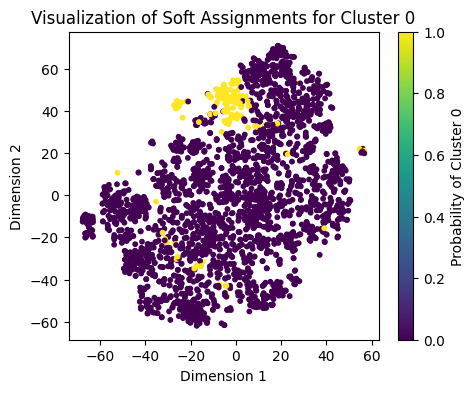

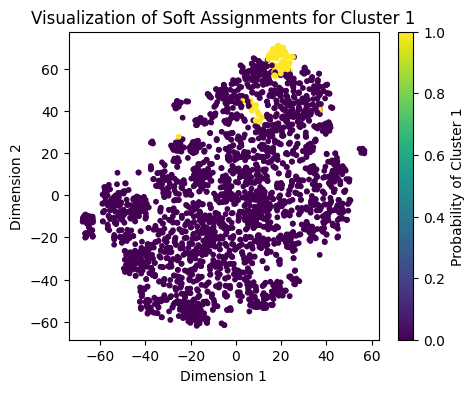

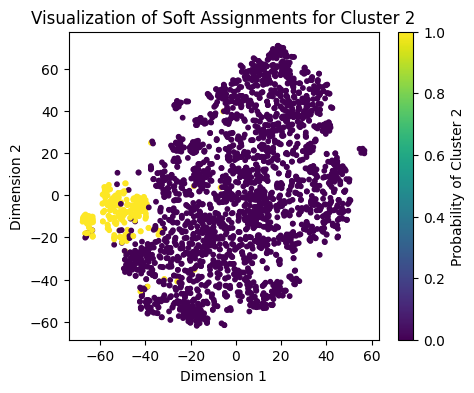

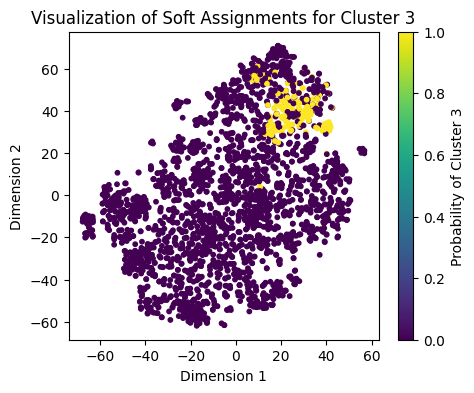

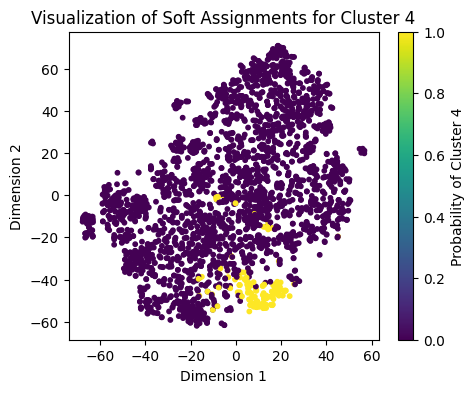

...

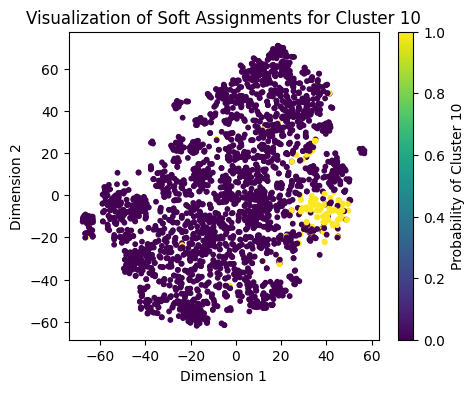

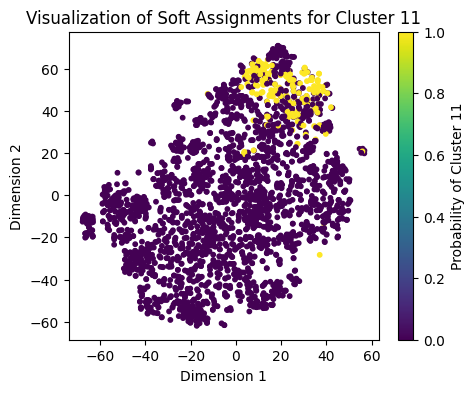

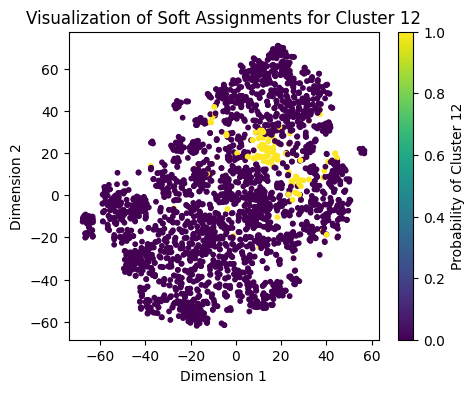

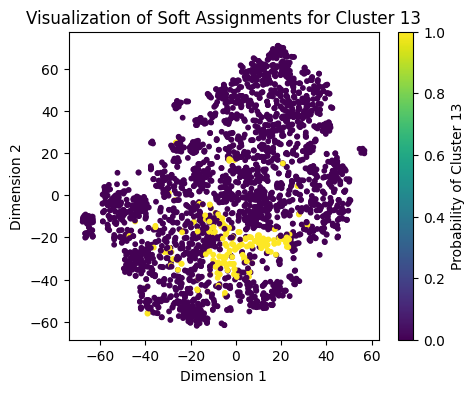

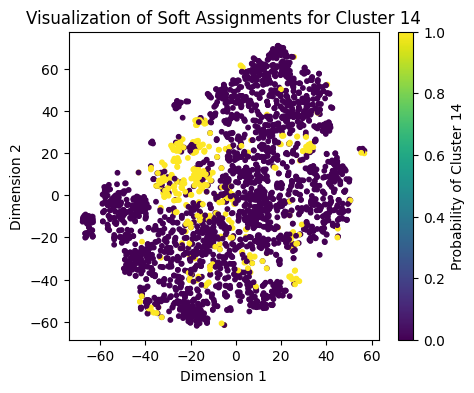

In [22]:
from sklearn.mixture import GaussianMixture
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import numpy as np

# Step 0: Extract embeddings from the DataFrame
backtrack_df['encoded_version'] = backtrack_df['encoded_version'].apply(
    lambda x: np.array(eval(x)) if isinstance(x, str) else np.array(x)
)

# Filter out rows where 'encoded_version' is still invalid (e.g., not arrays)
backtrack_df = backtrack_df.dropna(subset=['encoded_version'])

# Convert the embeddings column to a 2D NumPy array
embeddings = np.vstack(backtrack_df['encoded_version'].values)

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
embeddings = scaler.fit_transform(embeddings)

# Step 1: Reduce dimensionality for visualization
tsne = TSNE(n_components=2, random_state=42)
reduced_embeddings = tsne.fit_transform(embeddings)

# Step 2: Fit GMM
n_components = 15  # Adjust the number of components (clusters)
gmm = GaussianMixture(n_components=n_components, covariance_type='full', random_state=42)
gmm.fit(embeddings)

# Step 3: Extract soft cluster probabilities (responsibilities)
responsibilities = gmm.predict_proba(embeddings)

backtrack_df['gmm_cluster'] = gmm.predict(embeddings)

# Step 4: Visualize the probabilities for each cluster
for cluster_idx in range(n_components):
    plt.figure(figsize=(5, 4))
    plt.scatter(
        reduced_embeddings[:, 0],
        reduced_embeddings[:, 1],
        c=responsibilities[:, cluster_idx],  # Soft assignment for the current cluster
        cmap='viridis',
        s=10
    )
    plt.colorbar(label=f"Probability of Cluster {cluster_idx}")
    plt.title(f"Visualization of Soft Assignments for Cluster {cluster_idx}")
    plt.xlabel("Dimension 1")
    plt.ylabel("Dimension 2")
    plt.show()


In [23]:
backtrack_df.head()

,backtrack_word,count,encoded_version,gmm_cluster
0,Henry VIII of England,24,"[0.005353699438273907, 0.03386817127466202, -0...",9
1,International human rights instruments,6,"[-0.0464491993188858, -0.014102144166827202, -...",5
2,Ancient Egypt,59,"[-0.032279983162879944, 0.017722899094223976, ...",10
3,Airbus A380,8,"[-0.025435540825128555, 0.02881903201341629, -...",14
4,WorkChoices,3,"[-0.003005759324878454, -0.032285258173942566,...",14


In [24]:
# Group articles by their GMM cluster
articles_by_cluster = backtrack_df.groupby('gmm_cluster')['backtrack_word'].apply(list)

# Display articles grouped by cluster
for cluster_id, articles in articles_by_cluster.items():
    print(f"Cluster {cluster_id}:")
    print(articles[:10])  # Display only the first 10 articles for brevity
    print("-" * 80)

# Optionally, save the results to a file
# articles_by_cluster.to_csv('articles_by_gmm_cluster.csv', index=True)


Cluster 0:
['Hurricane Camille', 'Snowdonia', 'Lake Baikal', 'Thunderstorm', 'Southern Ocean', 'Severn crossing', 'Arctic Ocean', 'Volcano', 'Lake Tanganyika', 'English Channel']
--------------------------------------------------------------------------------
Cluster 1:
['Seychelles', 'Guadeloupe', 'Nauru', 'Cocos (Keeling) Islands', 'Puerto Rico', 'Maldives', 'Tokelau', 'Baker Island', 'Trinidad and Tobago', 'Palmyra Atoll']
--------------------------------------------------------------------------------
Cluster 2:
['Scientific classification', 'Brachiosaurus', 'Chimpanzee', 'Falcon', 'Bee', 'Arthropod', 'Cookiecutter shark', 'Eocene', 'Basking shark', 'Lion']
--------------------------------------------------------------------------------
Cluster 3:
['Sydney', 'Minneapolis, Minnesota', 'Almaty', 'Frankfurt', 'Columbus, Ohio', 'Wall Street', 'Taipei', 'Athens', 'Brighton', 'Paris']
--------------------------------------------------------------------------------
Cluster 4:
['Gas giant'

Number of backtracks by cluster:
gmm_cluster
0     1627
1      498
2     2314
3     1292
4     1089
5     1376
6     1873
7     5834
8     2770
9      425
10    1666
11    4374
12    1789
13    3287
14    3254
Name: count, dtype: int64


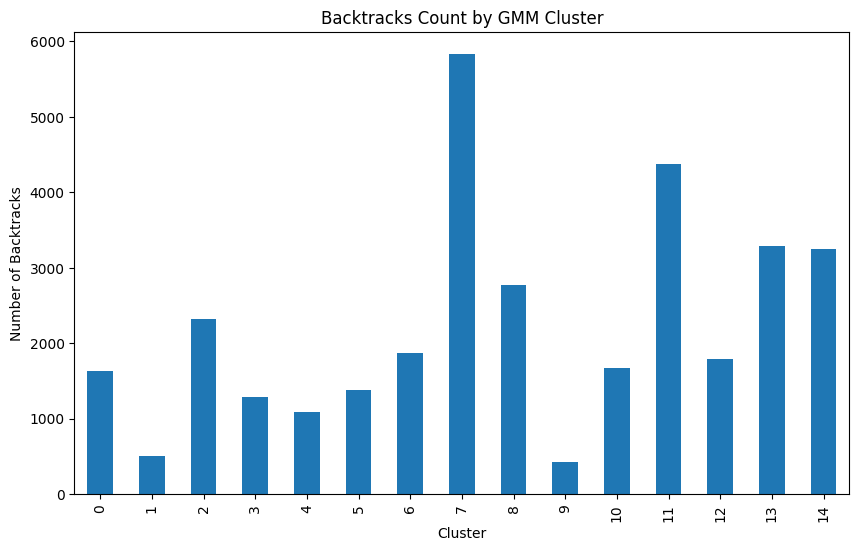

In [25]:
# Count the number of backtracks per cluster
backtracks_by_cluster = backtrack_df.groupby('gmm_cluster')['count'].sum()

# Display the count of backtracks by cluster
print("Number of backtracks by cluster:")
print(backtracks_by_cluster)

# Optional: Visualize the distribution as a bar plot
backtracks_by_cluster.plot(kind='bar', figsize=(10, 6), title="Backtracks Count by GMM Cluster")
plt.xlabel("Cluster")
plt.ylabel("Number of Backtracks")
plt.show()


---

## Test with all the words

In [26]:
all_paths, paths_finished, paths_unfinished = data_loader.load_paths()
articles = data_loader.load_articles()
categories = data_loader.load_categories()
links = data_loader.load_links()
distance_matrix = data_loader.load_distance_matrix()
embedding = pd.read_csv('data/embeddings.csv')
embedding['article'] = embedding['article'].apply(url_decode)

In [27]:
articles.head()

,article
0,Áedán mac Gabráin
1,Åland
2,Édouard Manet
3,Éire
4,Óengus I of the Picts


In [28]:
from collections import Counter
import pandas as pd

# Step 1: Flatten all articles into a single list
all_words = articles['article']

# Step 2: Remove duplicates to get all unique articles
all_articles = set(all_words)

# Step 4: Create a DataFrame with article words and their counts
all_words_df = pd.DataFrame({
    'article': list(word_counts.keys())
})

# Step 5: Map the encoded versions using the embedding dictionary
embedding_dict = dict(zip(embedding['article'], embedding['embedding']))
all_words_df['embedding'] = all_words_df['article'].map(embedding_dict)

# Display the resulting DataFrame
print(all_words_df.head())


          article                                          embedding
0   United States  [0.015777163207530975, 0.031141744926571846, -...
1  United Kingdom  [0.013564125634729862, 0.05490705743432045, -0...
2         England  [0.007582897320389748, 0.0556938610970974, -0....
3          Europe  [0.011930962093174458, 0.03444388881325722, -0...
4          Animal  [-0.019828541204333305, -0.0011695930734276772...


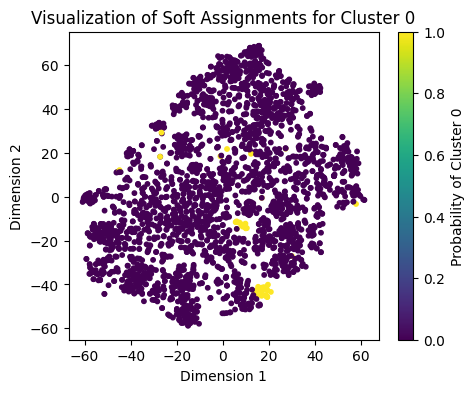

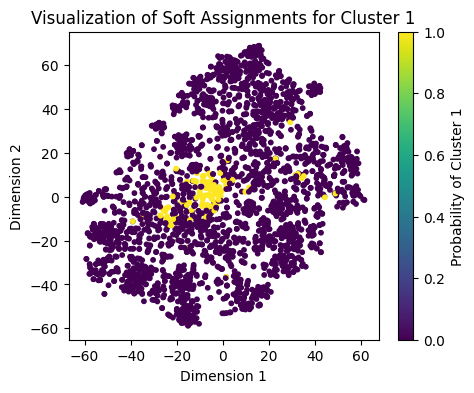

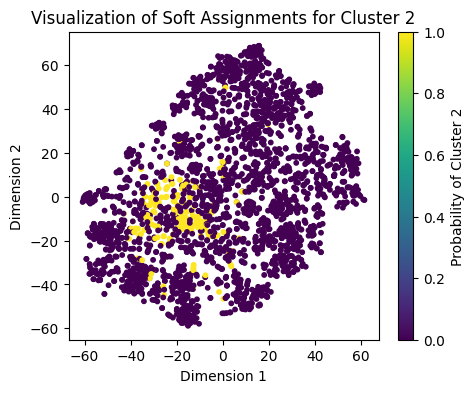

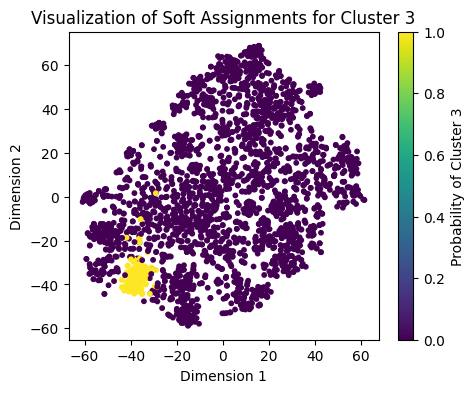

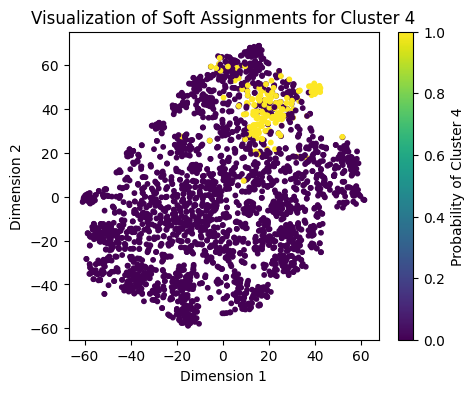

...

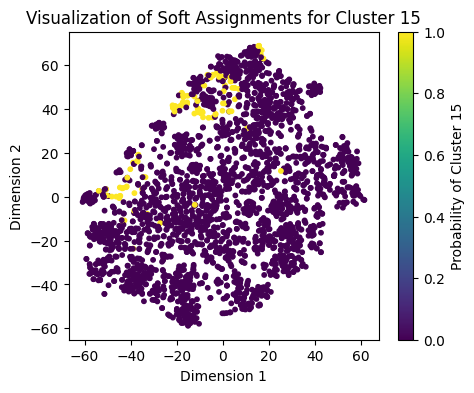

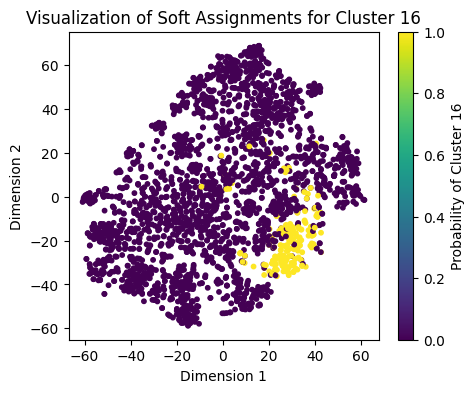

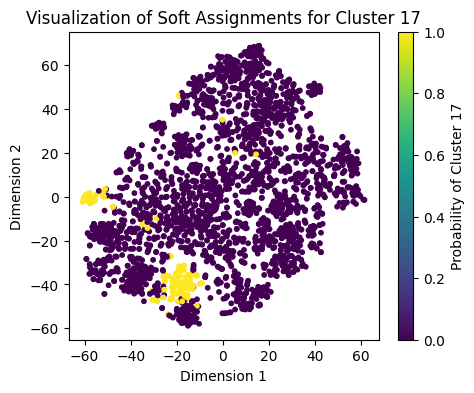

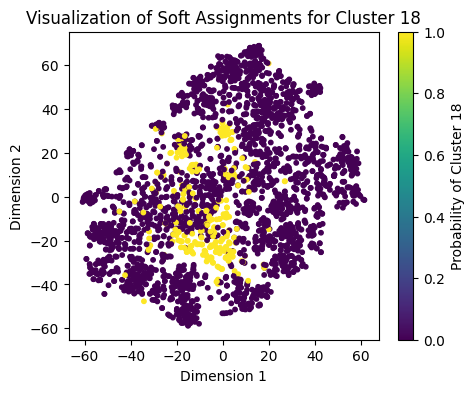

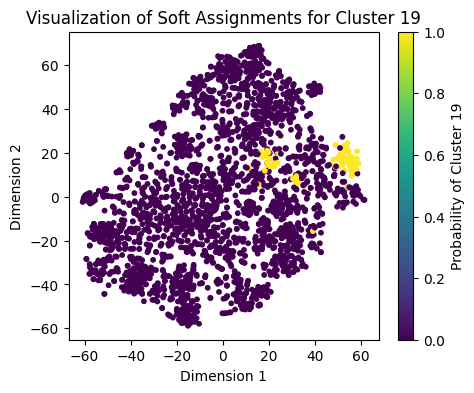

In [65]:
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Step 0: Extract embeddings from the DataFrame
all_words_df['embedding'] = all_words_df['embedding'].apply(
    lambda x: np.array(eval(x)) if isinstance(x, str) else np.array(x)
)

# Filter out rows where 'encoded_version' is still invalid (e.g., not arrays)
all_words_df = all_words_df.dropna(subset=['embedding'])

embeddings = np.vstack(all_words_df['embedding'].values)

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
embeddings = scaler.fit_transform(embeddings)

# Step 1: Reduce dimensionality for visualization
tsne = TSNE(n_components=2, random_state=42)
reduced_embeddings = tsne.fit_transform(embeddings)

# Step 2: Fit GMM
n_components = 20  # TODO
gmm = GaussianMixture(n_components=n_components, covariance_type='full', random_state=42)
gmm.fit(embeddings)

all_words_df['gmm_cluster'] = gmm.predict(embeddings)

# Step 3: Extract soft cluster probabilities (responsibilities)
responsibilities = gmm.predict_proba(embeddings)

# Step 4: Visualize the probabilities for each cluster
for cluster_idx in range(n_components):
    plt.figure(figsize=(5, 4))
    plt.scatter(
        reduced_embeddings[:, 0],
        reduced_embeddings[:, 1],
        c=responsibilities[:, cluster_idx],  # Soft assignment for the current cluster
        cmap='viridis',
        s=10
    )
    plt.colorbar(label=f"Probability of Cluster {cluster_idx}")
    plt.title(f"Visualization of Soft Assignments for Cluster {cluster_idx}")
    plt.xlabel("Dimension 1")
    plt.ylabel("Dimension 2")
    plt.show()


In [66]:
# Group articles by their GMM cluster
articles_by_cluster = all_words_df.groupby('gmm_cluster')['article'].apply(list)

# Display articles grouped by cluster
for cluster_id, articles in articles_by_cluster.items():
    print(f"Cluster {cluster_id}:")
    print(articles[:10])  # Display only the first 10 articles for brevity
    print("-" * 80)

# Optionally, save the results to a file
articles_by_cluster.to_csv('articles_by_gmm_cluster.csv', index=True)


Cluster 0:
['Apollo 11', 'Cape Canaveral', 'International Space Station', 'Aircraft', 'Royal Air Force', 'Airship', 'Neil Armstrong', 'Jet engine', 'Space Shuttle program', 'Space station']
--------------------------------------------------------------------------------
Cluster 1:
['Christianity', 'Agriculture', 'Religion', 'Biology', 'Mythology', 'Evolution', 'Gardening', 'Chemistry', 'Fiction', 'Genetics']
--------------------------------------------------------------------------------
Cluster 2:
['Europe', 'Animal', 'Film', 'Internet', 'Plant', 'Earth', 'Human', 'Food', 'Music', 'Sport']
--------------------------------------------------------------------------------
Cluster 3:
['Soybean', 'Potato', 'Seed', 'Maize', 'Cereal', 'Flower', 'Vegetable', 'Fruit', 'Peanut', 'Rice']
--------------------------------------------------------------------------------
Cluster 4:
['England', 'France', 'Germany', 'London', 'California', 'Scotland', 'New York City', 'Australia', 'Florida', 'Rome']
-

Need to compare this with the category dataset

In [67]:
# Remove leading/trailing dots from the category column
categories['cleaned_category'] = categories['category'].str.strip('.')

# Replace dots with spaces for better readability
categories['cleaned_category'] = categories['cleaned_category'].str.replace('.', ' ', regex=False)

# Remove the word "subject"
categories['cleaned_category'] = categories['cleaned_category'].str.replace(r'\bsubject\b', '', regex=True).str.strip()

# Extract the main theme (first word) and create a new column
categories['main_theme'] = categories['cleaned_category'].apply(lambda x: x.split(' ')[0])

# Group by main theme and count occurrences
categories_grouped = categories.groupby('main_theme')['cleaned_category'].apply(list)
category_counts = categories['main_theme'].value_counts()

In [68]:
categories.head()

,article,category,cleaned_category,main_theme
0,Áedán mac Gabráin,subject.History.British_History.British_Histor...,History British_History British_History_1500_a...,History
1,Áedán mac Gabráin,subject.People.Historical_figures,People Historical_figures,People
2,Åland,subject.Countries,Countries,Countries
3,Åland,subject.Geography.European_Geography.European_...,Geography European_Geography European_Countries,Geography
4,Édouard Manet,subject.People.Artists,People Artists,People


In [69]:
# Group articles by 'main_theme' and create a DataFrame
articles_by_cat = categories.groupby('main_theme')['article'].apply(list).reset_index()

# Rename the columns
articles_by_cat.columns = ['Main Theme', 'Articles']

# Display articles grouped by cluster (as you did before)
for main_theme, article in articles_by_cat.itertuples(index=False):
    print(f"{main_theme}:")
    print(article[:10])  # Display only the first 10 articles for brevity
    print("-" * 80)

# Save to CSV
articles_by_cat.to_csv('articles_by_cat.csv', index=False)


Art:
['Abstract art', 'Art', 'Arts and crafts', 'Baroque', 'Brush', 'Buddhist art', 'Calligraphy', 'Constructivism (art)', 'Cubism', 'Drama']
--------------------------------------------------------------------------------
Business_Studies:
['€2 commemorative coins', 'AT&T', 'Accountancy', 'Acorn Computers', 'Actuary', 'Adam Smith', 'Advertising', 'BAE Systems', 'BP', 'Bank of China (Hong Kong)']
--------------------------------------------------------------------------------
Citizenship:
['Acid rain', 'African Union', 'Al Jazeera', 'Al Jazeera', 'Anarcho-capitalism', 'Animal law', 'Animal rights', 'Arab-Israeli conflict', 'Arab League', 'Autocracy']
--------------------------------------------------------------------------------
Countries:
['Åland', 'Éire', 'Abkhazia', 'Abu Dhabi', 'Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola', 'Anguilla']
--------------------------------------------------------------------------------
Design_and_Technology:
['2-6-0', '2-8-0', '4-2-0', '4-4

## merge everything to compare and see differences

In [70]:
merge_Cat = pd.merge(all_words_df, categories, on="article", how="inner")

In [71]:
merge_Cat.head()

,article,embedding,gmm_cluster,category,cleaned_category,main_theme
0,United States,"[0.015777163207530975, 0.031141744926571846, -...",11,subject.Countries,Countries,Countries
1,United States,"[0.015777163207530975, 0.031141744926571846, -...",11,subject.Geography.North_American_Geography,Geography North_American_Geography,Geography
2,United Kingdom,"[0.013564125634729862, 0.05490705743432045, -0...",10,subject.Countries,Countries,Countries
3,United Kingdom,"[0.013564125634729862, 0.05490705743432045, -0...",10,subject.Geography.European_Geography.European_...,Geography European_Geography European_Countries,Geography
4,United Kingdom,"[0.013564125634729862, 0.05490705743432045, -0...",10,subject.Geography.Geography_of_Great_Britain,Geography Geography_of_Great_Britain,Geography


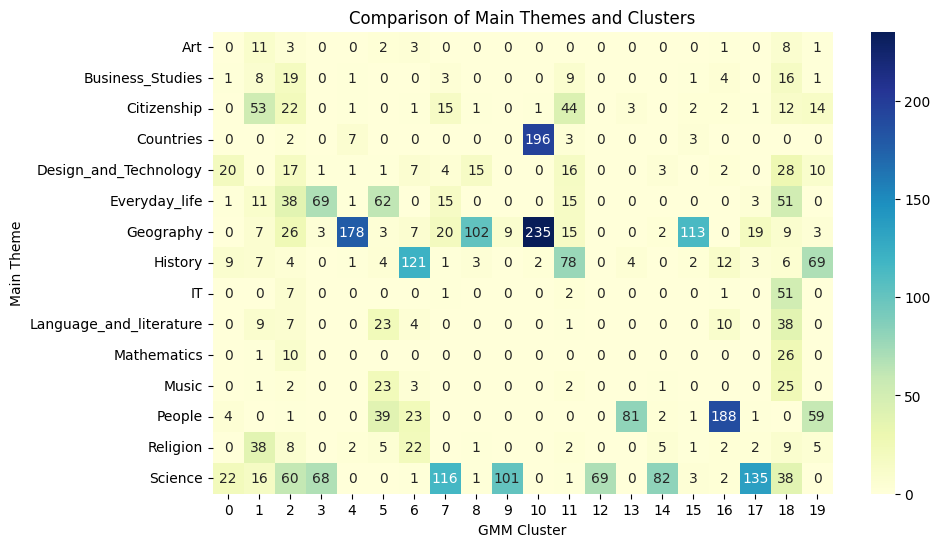

In [72]:
import seaborn as sns
import matplotlib.pyplot as plt

# Create a cross-tab for heatmap
cross_tab = pd.crosstab(merge_Cat['main_theme'], merge_Cat['gmm_cluster'])

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(cross_tab, annot=True, fmt="d", cmap="YlGnBu")
plt.title("Comparison of Main Themes and Clusters")
plt.xlabel("GMM Cluster")
plt.ylabel("Main Theme")
plt.show()


In [73]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Compute adjusted Rand index or NMI
ari = adjusted_rand_score(merge_Cat['main_theme'], merge_Cat['gmm_cluster'])
nmi = normalized_mutual_info_score(merge_Cat['main_theme'], merge_Cat['gmm_cluster'])

print(f"Adjusted Rand Index: {ari}")
print(f"Normalized Mutual Information: {nmi}")


Adjusted Rand Index: 0.21410182744648149
Normalized Mutual Information: 0.4367562414083218


---

Whole thing to see how ari and nmi change accordingly to the number of cluster

In [101]:
# Remove leading/trailing dots from the category column
categories['cleaned_category'] = categories['category'].str.strip('.')

# Replace dots with spaces for better readability
categories['cleaned_category'] = categories['cleaned_category'].str.replace('.', ' ', regex=False)

# Remove the word "subject"
categories['cleaned_category'] = categories['cleaned_category'].str.replace(r'\bsubject\b', '', regex=True).str.strip()

# Extract the main theme (first word) and create a new column
categories['main_theme'] = categories['cleaned_category'].apply(lambda x: x.split(' ')[0])

# Group by main theme and count occurrences
categories_grouped = categories.groupby('main_theme')['cleaned_category'].apply(list)
category_counts = categories['main_theme'].value_counts()

In [102]:
from tqdm import tqdm
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from sklearn.mixture import GaussianMixture
import pandas as pd

raise ValueError("Don't think you want to run this one")


nb_clusters_range = np.linspace(1, 50, 50).astype(int)  # Convert to integers
ari_all = []
nmi_all = []

for nb_cluster in tqdm(nb_clusters_range):
    # Step 2: Fit GMM
    gmm = GaussianMixture(n_components=nb_cluster, covariance_type='full', random_state=42)
    gmm.fit(embeddings)
    # Assign clusters
    all_words_df['gmm_cluster'] = gmm.predict(embeddings)
    merge_Cat = pd.merge(all_words_df, categories, on="article", how="inner")
    ari = adjusted_rand_score(merge_Cat['main_theme'], merge_Cat['gmm_cluster'])
    ari_all.append(ari)
    nmi = normalized_mutual_info_score(merge_Cat['main_theme'], merge_Cat['gmm_cluster'])
    nmi_all.append(nmi)





















































100%|██████████| 50/50 [37:39<00:00, 45.19s/it]


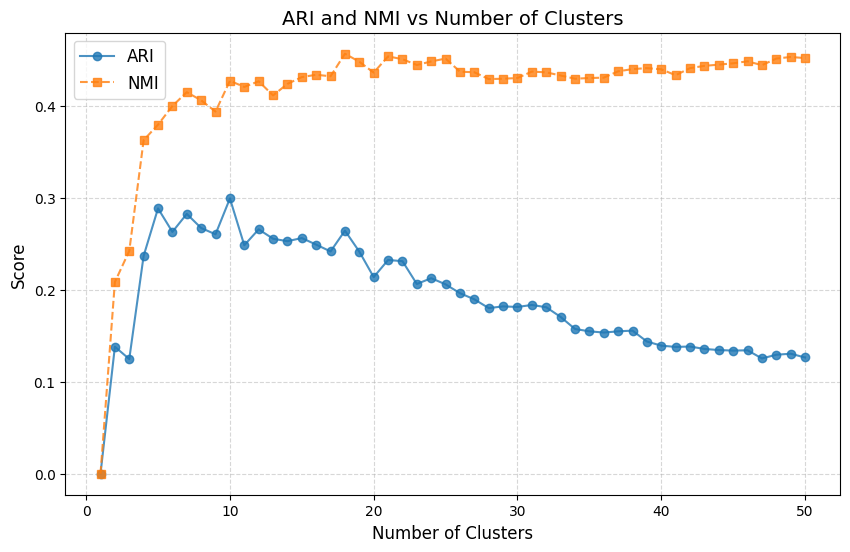

In [108]:
# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(nb_clusters_range, ari_all, label="ARI", marker="o", linestyle="-", alpha=0.8)
plt.plot(nb_clusters_range, nmi_all, label="NMI", marker="s", linestyle="--", alpha=0.8)

# Add labels, title, and legend
plt.title("ARI and NMI vs Number of Clusters", fontsize=14)
plt.xlabel("Number of Clusters", fontsize=12)
plt.ylabel("Score", fontsize=12)
plt.legend(fontsize=12)
plt.grid(alpha=0.5, linestyle="--")

# Show the plot
plt.show()

Same thing with the shortest distance

---

### Hierarchical Clustering

Est-ce la meme chose avec les sous-categories ? 

In [103]:
all_paths, paths_finished, paths_unfinished = data_loader.load_paths()
articles = data_loader.load_articles()
categories = data_loader.load_categories()
links = data_loader.load_links()
distance_matrix = data_loader.load_distance_matrix()
embedding = pd.read_csv('data/embeddings.csv')
embedding['article'] = embedding['article'].apply(url_decode)

Clustering Progress: 56it [58:34, 62.75s/it]
Clustering Progress: 80it [55:38, 41.73s/it]


In [104]:
from collections import Counter
import pandas as pd

# Step 1: Flatten all articles into a single list
all_words = articles['article']

# Step 2: Remove duplicates to get all unique articles
all_articles = set(all_words)

# Step 4: Create a DataFrame with article words and their counts
all_words_df = pd.DataFrame({
    'article': list(word_counts.keys())
})

# Step 5: Map the encoded versions using the embedding dictionary
embedding_dict = dict(zip(embedding['article'], embedding['embedding']))
all_words_df['embedding'] = all_words_df['article'].map(embedding_dict)

# Display the resulting DataFrame
print(all_words_df.head())


          article                                          embedding
0   United States  [0.015777163207530975, 0.031141744926571846, -...
1  United Kingdom  [0.013564125634729862, 0.05490705743432045, -0...
2         England  [0.007582897320389748, 0.0556938610970974, -0....
3          Europe  [0.011930962093174458, 0.03444388881325722, -0...
4          Animal  [-0.019828541204333305, -0.0011695930734276772...


In [105]:
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np


# Step 0: Extract embeddings from the DataFrame
all_words_df['embedding'] = all_words_df['embedding'].apply(
    lambda x: np.array(eval(x)) if isinstance(x, str) else np.array(x)
)

# Filter rows with valid embeddings
all_words_df = all_words_df.dropna(subset=['embedding'])

# Extract embeddings and corresponding article names
embeddings = np.vstack(all_words_df['embedding'].values)
article_names = all_words_df['article'].values

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
embeddings = scaler.fit_transform(embeddings)

In [106]:
from sklearn.mixture import GaussianMixture
import numpy as np
from tqdm import tqdm

def hierarchical_gmm(data, max_depth=3, cluster_threshold=10, n_components=2):
    """
    Perform hierarchical GMM clustering with tqdm for progress tracking.

    Args:
        data (ndarray): Input data of shape (n_samples, n_features).
        max_depth (int): Maximum depth of the hierarchy.
        cluster_threshold (int): Minimum number of points in a cluster to stop splitting.
        n_components (int): Number of GMM components.

    Returns:
        dict: A dictionary representing the hierarchical clustering.
    """
    # Initialize tqdm progress bar
    progress = tqdm(total=2 ** max_depth - 1, desc="Clustering Progress")

    def recursive_clustering(data, depth):
        # Update progress bar
        progress.update(1)

        # Stop recursion if cluster is too small or max depth reached
        if len(data) <= cluster_threshold or depth >= max_depth:
            return {"cluster": data}

        # Fit a GMM
        gmm = GaussianMixture(n_components=n_components, random_state=42)
        labels = gmm.fit_predict(data)

        # Create subclusters
        clusters = {}
        for cluster_id in range(n_components):
            sub_data = data[labels == cluster_id]
            clusters[f"subcluster_{cluster_id}"] = recursive_clustering(sub_data, depth + 1)

        return clusters

    # Start recursive clustering
    hierarchy = recursive_clustering(data, depth=1)

    # Close the progress bar
    progress.close()

    return hierarchy


In [107]:
# Perform hierarchical GMM
hierarchical_clusters = hierarchical_gmm(embeddings, max_depth=3, cluster_threshold=10, n_components=25)


Clustering Progress:   0%|          | 0/7 [00:00<?, ?it/s]

KeyboardInterrupt: 

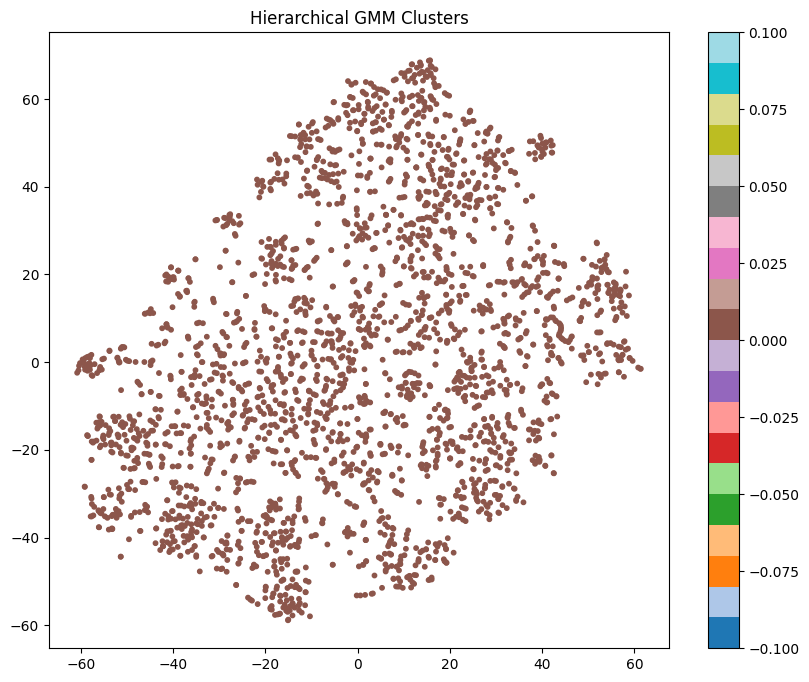

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def flatten_hierarchy(hierarchy, labels=None, cluster_id=0):
    # Initialize labels if it's the first call
    if labels is None:
        labels = np.zeros(len(embeddings), dtype=int)

    # Check if the current hierarchy contains a cluster
    if "cluster" in hierarchy:
        # Get valid indices and assign the cluster ID
        indices = np.array(hierarchy["cluster"], dtype=int)
        labels[indices] = cluster_id
    else:
        # Recursively process subclusters
        for subcluster_id, subcluster in enumerate(hierarchy.values()):
            flatten_hierarchy(subcluster, labels, cluster_id * 10 + subcluster_id)

    return labels


# Reduce dimensions for visualization
tsne = TSNE(n_components=2, random_state=42)
reduced_data = tsne.fit_transform(embeddings)

# Assign hierarchical labels
cluster_labels = flatten_hierarchy(hierarchical_clusters)

# Plot the clusters
plt.figure(figsize=(10, 8))
plt.scatter(reduced_data[:, 0], reduced_data[:, 1], c=cluster_labels, cmap='tab20', s=10)
plt.colorbar()
plt.title("Hierarchical GMM Clusters")
plt.show()

In [ ]:
from sklearn.metrics import silhouette_score, silhouette_samples

silhouette_avg = silhouette_score(embeddings, cluster_labels)

# Compute silhouette scores for each sample
sample_silhouette_values = silhouette_samples(embeddings, cluster_labels)

# Number of clusters
n_clusters = len(np.unique(cluster_labels))

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))
y_lower = 10

for i in range(n_clusters):
    # Get silhouette scores for samples in this cluster
    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
    ith_cluster_silhouette_values.sort()

    size_cluster_i = len(ith_cluster_silhouette_values)
    y_upper = y_lower + size_cluster_i

    # Fill silhouette scores
    ax.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values)
    ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

    y_lower = y_upper + 10  # Add space between clusters

# Customize the plot
ax.set_title("Silhouette Plot for Clusters")
ax.set_xlabel("Silhouette Coefficient")
ax.set_ylabel("Cluster")
ax.axvline(x=silhouette_avg, color="red", linestyle="--", label="Average Silhouette")
ax.legend()
plt.show()


ValueError: Number of labels is 1. Valid values are 2 to n_samples - 1 (inclusive)

In [ ]:
from scipy.cluster.hierarchy import linkage, dendrogram

# Compute the linkage matrix
linkage_matrix = linkage(embeddings, method='ward', metric='euclidean')

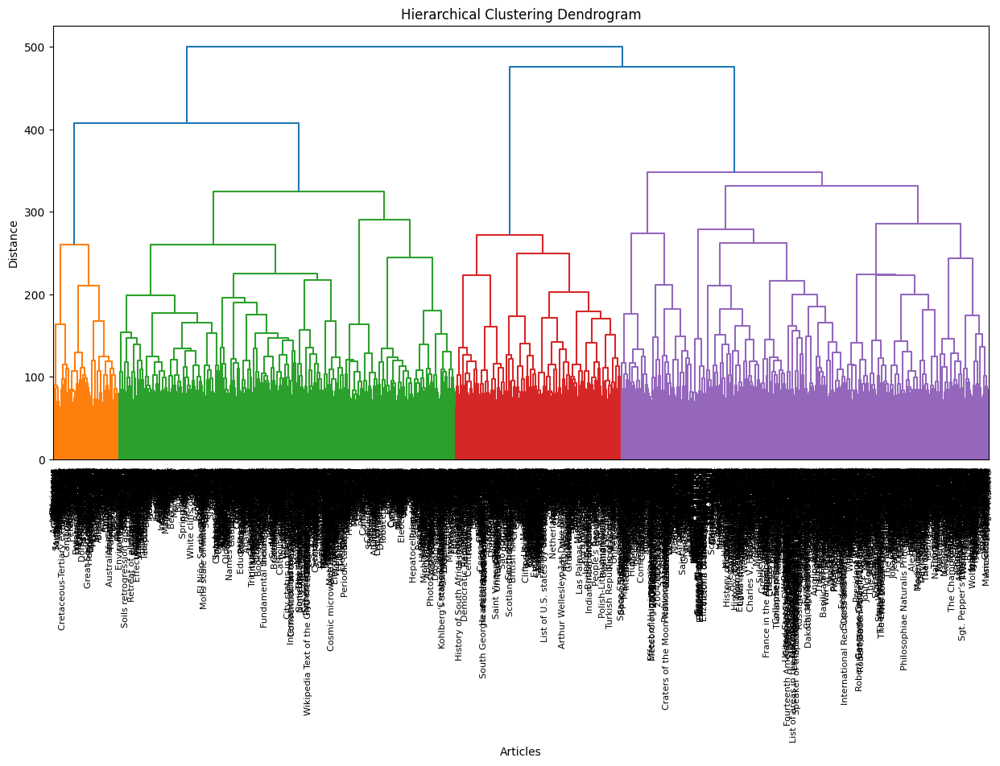

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))
dendrogram(linkage_matrix, labels=article_names, leaf_rotation=90, leaf_font_size=8)
plt.title("Hierarchical Clustering Dendrogram")
plt.xlabel("Articles")
plt.ylabel("Distance")
plt.show()
